In [2]:
!nvidia-smi

Mon May 24 17:17:07 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 465.19.01    Driver Version: 465.19.01    CUDA Version: 11.3     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA TITAN X ...  Off  | 00000000:81:00.0 Off |                  N/A |
| 29%   51C    P8    10W / 250W |    753MiB / 12196MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [3]:
# !pip install --pre --index-url https://pypi.fury.io/tang/ --extra-index-url https://pypi.python.org/simple symfac

In [5]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import functools
import numpy as np
import scipy.linalg as sla
import torch
from torch import optim
import torch.nn.functional as F
import matplotlib.pyplot as plt
from tqdm import tqdm, trange

from symfac.experimental import RBFExpansionV2, RBFExpansionMiniBatch

# Test driver

In [6]:
def test(target, ks, fac_callback):

    is_symmetric = target.shape[0] == target.shape[1] and np.abs(target - target.T).max() < 1e-14

    np.set_printoptions(precision=5, suppress=True, linewidth=320)
    U, S, V = np.linalg.svd(target.detach().numpy())

    # print('Singular values of the target matrix:', S)

    svd_reconstruction_loss = np.array([
        F.mse_loss(torch.tensor((U[:, :k] * S[None, :k]) @ V[:k, :]), target)
        for k in range(1, min(n, m) + 1)
    ])
    
    # print(svd_reconstruction_loss)

    for k in ks:

        fac = fac_callback(target, k)

        fig, axs = plt.subplots(1, 6, figsize=(26, 4), dpi=100)

        axs[0].plot(
            fac.report.loss_history_ticks,
            fac.report.loss_history,
            lw=0.5,
            alpha=0.5,
        )
        axs[0].plot(
            fac.report.loss_history_ticks,
            fac.report.loss_history.min(axis=1),
            lw=1,
            color='k'
        )
        axs[0].set_xscale('log')
        axs[0].set_yscale('log')
        axs[0].set_ylabel('loss')
        axs[0].set_xlabel('t')
        # axs[0].set_ybound(lower=1e-7)
        svd_equiv = np.flatnonzero(fac.report.loss_best.min().numpy() > svd_reconstruction_loss)[0] + 1
        DOF_per_rank_svd = n if is_symmetric else n + m
        DOF_per_rank_fac = np.sum([w.nelement() for w in fac.optimum.x]) / (fac.batch_size * fac.k)
        axs[0].set_title(f'Equiv. to SVD of {svd_equiv}\nDOF/rank: {DOF_per_rank_fac/DOF_per_rank_svd:.1f}x svd\nOverall efficiency: {(svd_equiv * DOF_per_rank_svd) / (DOF_per_rank_fac * fac.k):.1f}x SVD')

        # fac.flat_parameters = fac.report.best_flat_parameters
        best_run = torch.argmin(fac.report.loss_best)
        i_largest_component = torch.argmax(fac.optimum.a[best_run, ...])

        rbf_reconstruction = fac.optimum(runs=best_run)
        rbf_largest_component = fac.optimum(runs=best_run, components=i_largest_component)

        axs[1].imshow(rbf_largest_component)
        axs[1].set_title(f'1st component')

        axs[2].bar(
            np.arange(min(n, m)),
            rbf_reconstruction.diagonal()
        )
        axs[2].set_title('diagonal of recon\'ed matrix')

        axs[3].imshow(rbf_reconstruction, vmin=-3, vmax=3)
        axs[3].set_title('reconstructed matrix')

        axs[4].imshow(target, vmin=-3, vmax=3)
        axs[4].set_title('Original matrix')

        rbf_reconstruction_svs = sla.svdvals(rbf_reconstruction)
        rbf_largest_component_svs = sla.svdvals(rbf_largest_component)
        ticks = np.arange(min(n, m)) + 1
        axs[5].scatter(
            ticks,
            S / S.max(),
            marker='+',
            label=r'Singular value of $K$'
        )
        axs[5].scatter(
            ticks,
            rbf_reconstruction_svs / rbf_reconstruction_svs.max(),
            marker='+',
            label=r'Singular value of $\tilde{K}$'
        )
        axs[5].scatter(
            ticks,
            rbf_largest_component_svs / rbf_largest_component_svs.max(),
            marker='+',
            label=r'Singular value of 1st component'
        )
        axs[5].set_title('Eigenspectrum')
        axs[5].legend()
        plt.show()

# Fit Gaussian Noises
---


## Symmetric matrices

In [11]:
fac = RBFExpansionV2(k=1)

fac.fit(torch.rand(4, 4))

100%|██████████| 10000/10000 [00:21<00:00, 472.12it/s]


In [17]:
import pickle
open('some-factorization-result.pickle', 'wb').write(pickle.dumps(fac.optimum.x))

3853

In [18]:
fac.optimum.x_names

['u', 'v', 'a', 'b']

In [19]:
len(fac.optimum.x)

4

In [20]:
fac.report.loss_history

array([[1.273  , 3.21716, 3.07391, ..., 0.15704, 3.42512, 0.92785],
       [0.85985, 2.34342, 2.58169, ..., 0.0881 , 2.936  , 0.6545 ],
       [0.54679, 1.71567, 2.12414, ..., 0.05761, 2.49974, 0.44679],
       ...,
       [0.01604, 0.0404 , 0.02869, ..., 0.03892, 0.03012, 0.01048],
       [0.01605, 0.0404 , 0.02869, ..., 0.03892, 0.03012, 0.01056],
       [0.01606, 0.0404 , 0.02869, ..., 0.03892, 0.03012, 0.01066]])

In [21]:
fac.report.loss_best

tensor([0.0160, 0.0404, 0.0287, 0.0125, 0.0176, 0.0340, 0.0296, 0.0103, 0.0103,
        0.0356, 0.0103, 0.0043, 0.0297, 0.0125, 0.0302, 0.0125, 0.0462, 0.0103,
        0.0170, 0.0103, 0.0103, 0.0375, 0.0444, 0.0350, 0.0391, 0.0170, 0.0223,
        0.0103, 0.0241, 0.0427, 0.0241, 0.0272, 0.0241, 0.0296, 0.0478, 0.0420,
        0.0287, 0.0146, 0.0375, 0.0314, 0.0117, 0.0126, 0.0403, 0.0301, 0.0169,
        0.0348, 0.0372, 0.0445, 0.0219, 0.0160, 0.0103, 0.0103, 0.0220, 0.0329,
        0.0170, 0.0279, 0.0233, 0.0116, 0.0390, 0.0100, 0.0291, 0.0389, 0.0301,
        0.0103])

100%|██████████| 10000/10000 [00:13<00:00, 718.02it/s]


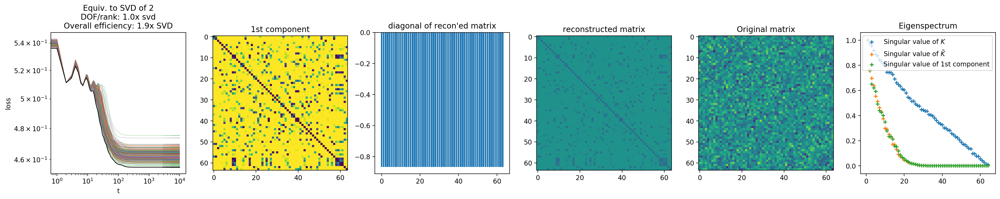

100%|██████████| 10000/10000 [00:18<00:00, 548.28it/s]


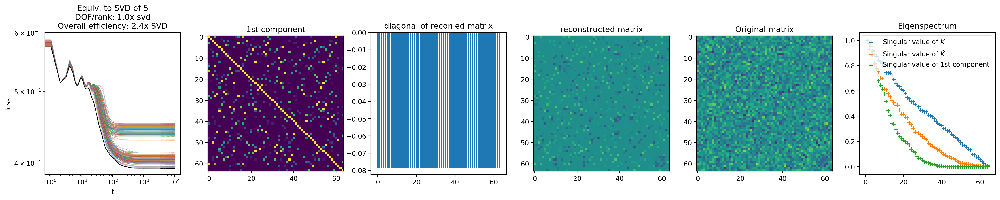

100%|██████████| 10000/10000 [00:25<00:00, 396.15it/s]


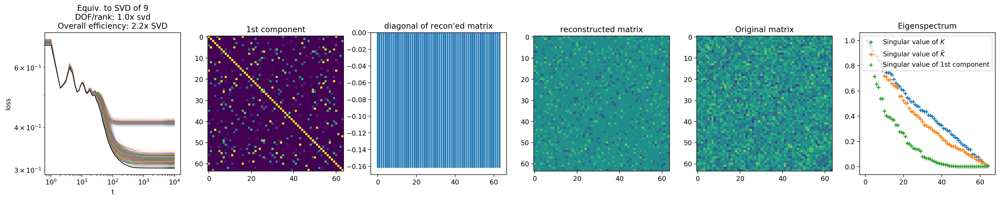

100%|██████████| 10000/10000 [00:42<00:00, 236.34it/s]


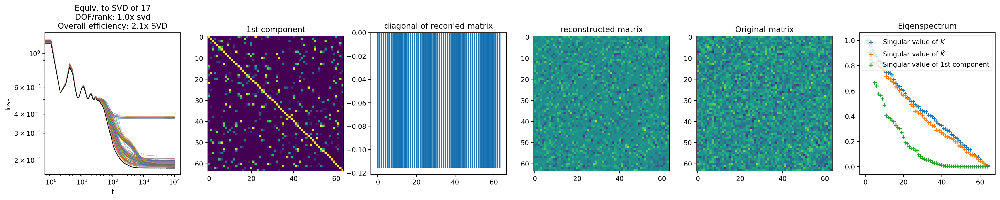

100%|██████████| 10000/10000 [01:18<00:00, 127.07it/s]


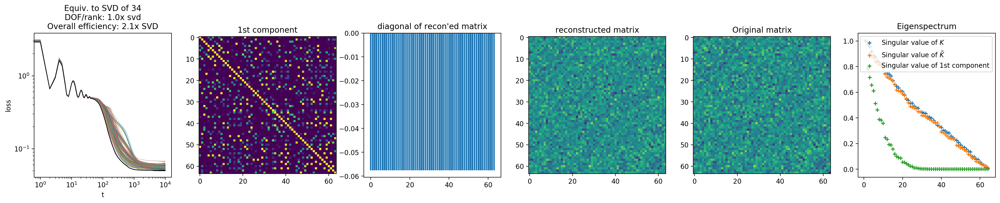

100%|██████████| 10000/10000 [02:54<00:00, 57.36it/s]


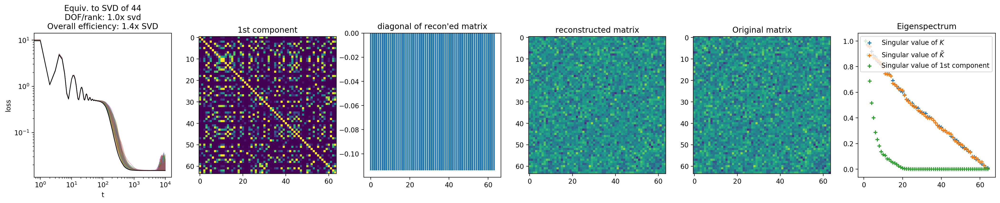

In [8]:
'''
component = rbf(u, u')
'''

n = 64
m = 64
batch_size = 256
def symmetrize(K):
    return 0.5 * (K + K.T)
target = symmetrize(torch.normal(0.0, 1.0, (n, m)))

fac = RBFExpansionV2(k=1, rbf='gauss')

test(
    target=target,
    ks=[1, 2, 4, 8, 16, 32],
    fac_callback=lambda target, k: RBFExpansionV2(
        k=k,
        rbf='gauss',
        batch_size=batch_size,
        max_steps=10000
    ).fit_custom(
        target,
        f=lambda u, a, b: torch.sum(
            fac.rbf(
                (u[..., :, None, :] - u[..., None, :, :])
            ) * a[..., None, None, :],
            dim=-1
        ) + b[..., None, None],
        u=0.01 * torch.rand(batch_size, n, k),
        a=0.01 * torch.rand(batch_size, k),
        b=0.01 * torch.rand(batch_size),       
    )
)

Object `RBFExpansionV2` not found.


100%|██████████| 10000/10000 [00:13<00:00, 737.57it/s]


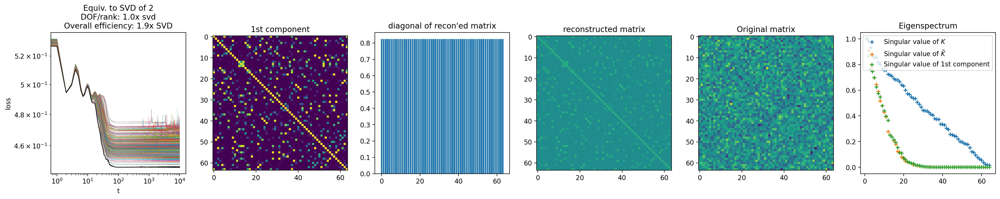

100%|██████████| 10000/10000 [00:19<00:00, 518.03it/s]


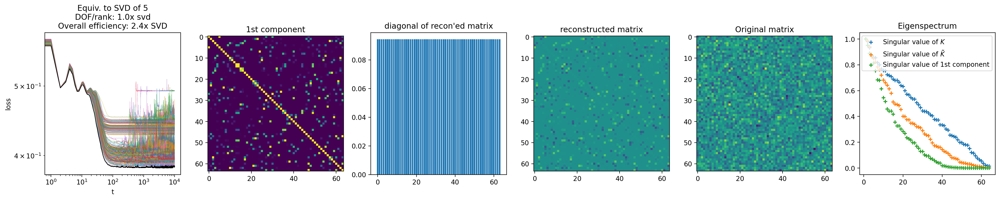

100%|██████████| 10000/10000 [00:32<00:00, 312.38it/s]


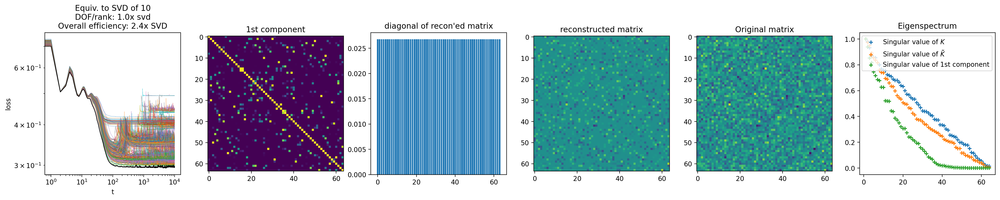

100%|██████████| 10000/10000 [00:57<00:00, 172.52it/s]


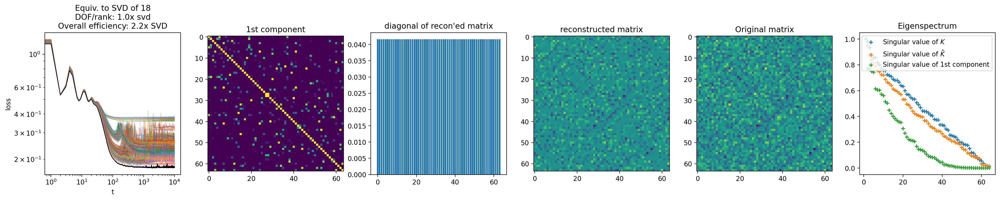

  6%|▌         | 610/10000 [00:06<01:44, 89.97it/s]


KeyboardInterrupt: 

In [69]:
'''
component = modified periodic(u, u') with variable l
'''

n = 64
m = 64
batch_size = 256
def symmetrize(K):
    return 0.5 * (K + K.T)
target = symmetrize(torch.normal(0.0, 1.0, (n, m)))

test(
    target=target,
    ks=[1, 2, 4, 8, 16, 32],
    fac_callback=lambda target, k: RBFExpansionV2(
        k=k,
        rbf='gauss',
        batch_size=batch_size,
        max_steps=10000
    ).fit_custom(
        target,
        f=lambda u, a, l, b: torch.sum(
            fac.rbf(
                torch.sin(u[..., :, None, :] - u[..., None, :, :]) * torch.exp(l[..., None, None, :])
            ) * a[..., None, None, :],
            dim=-1
        ) + b[..., None, None],
        u=0.01 * torch.rand(batch_size, n, k),
        a=0.01 * torch.rand(batch_size, k),
        l=0.01 * torch.randn(batch_size, k),
        b=0.01 * torch.rand(batch_size),       
    )
)

100%|██████████| 10000/10000 [00:18<00:00, 537.78it/s]


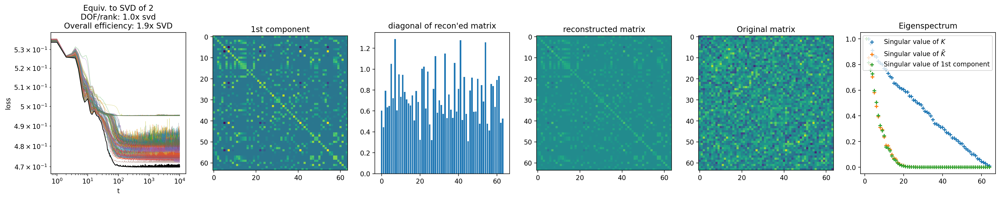

100%|██████████| 10000/10000 [00:24<00:00, 415.32it/s]


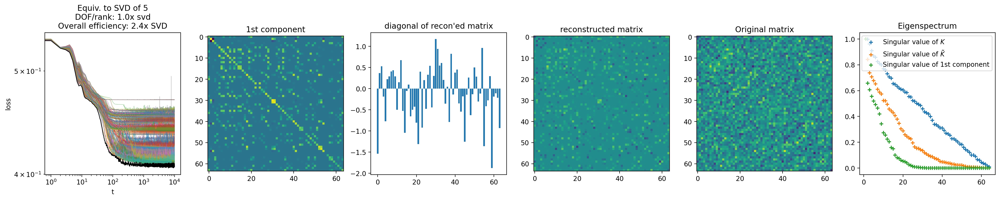

100%|██████████| 10000/10000 [00:40<00:00, 245.39it/s]


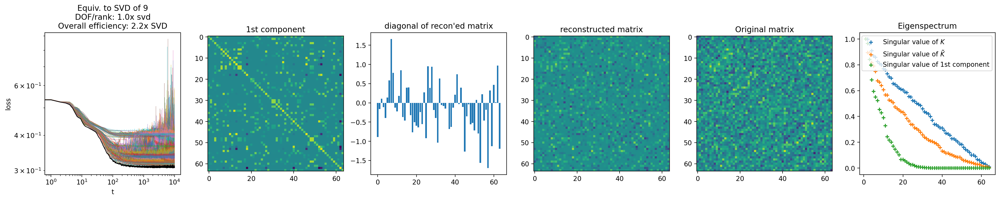

100%|██████████| 10000/10000 [01:16<00:00, 131.58it/s]


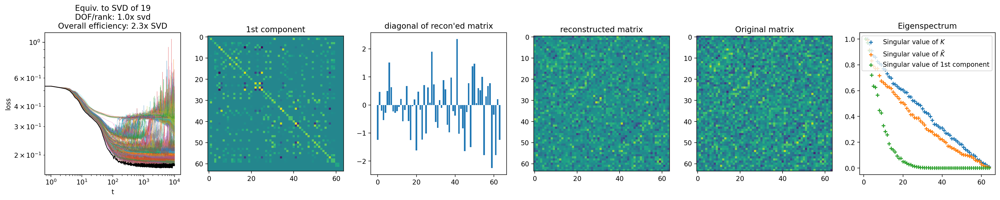

100%|██████████| 10000/10000 [02:23<00:00, 69.76it/s]


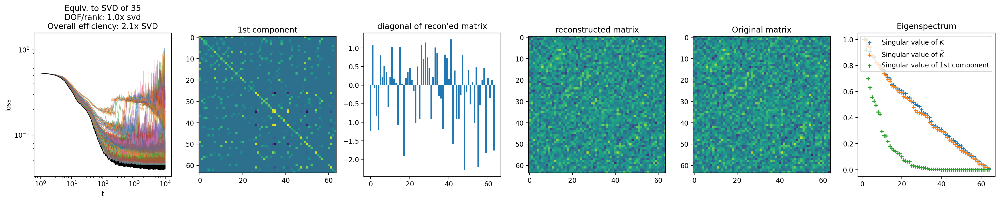

 32%|███▏      | 3203/10000 [01:44<03:41, 30.69it/s]


KeyboardInterrupt: 

In [70]:
'''
component = u * u' * modified_periodic(u, u') with variable l
'''

n = 64
m = 64
batch_size = 256
def symmetrize(K):
    return 0.5 * (K + K.T)
target = symmetrize(torch.normal(0.0, 1.0, (n, m)))

test(
    target=target,
    ks=[1, 2, 4, 8, 16, 32],
    fac_callback=lambda target, k: RBFExpansionV2(
        k=k,
        rbf='gauss',
        batch_size=batch_size,
        max_steps=10000
    ).fit_custom(
        target,
        f=lambda u, a, l, b: torch.sum(
            fac.rbf(
                torch.sin(u[..., :, None, :] - u[..., None, :, :]) * torch.exp(l[..., None, None, :])
            ) *
            u[..., :, None, :] *
            u[..., None, :, :] *
            a[..., None, None, :],
            dim=-1
        ) + b[..., None, None],
        u=0.01 * torch.rand(batch_size, n, k),
        a=0.01 * torch.rand(batch_size, k),
        l=0.01 * torch.randn(batch_size, k),
        b=0.01 * torch.rand(batch_size),       
    )
)

# Asymmetric Gaussian matrices

In [ ]:
'''
component = sqexp(u, v)
'''

n = 64
m = 64
batch_size = 256
target = torch.normal(0.0, 1.0, (n, m))

test(
    target=target,
    ks=[1, 2, 4, 8, 16, 32],
    fac_callback=lambda target, k: RBFExpansionV2(
        k=k,
        rbf='gauss',
        batch_size=batch_size,
        max_steps=10000
    ).fit(
        target,
        u0=0.01 * torch.rand(batch_size, n, k),
        v0=0.01 * torch.rand(batch_size, m, k),
        a0=0.01 * torch.rand(batch_size, k),
        b0=0.01 * torch.rand(batch_size),
    )
)

100%|██████████| 10000/10000 [00:11<00:00, 858.57it/s]


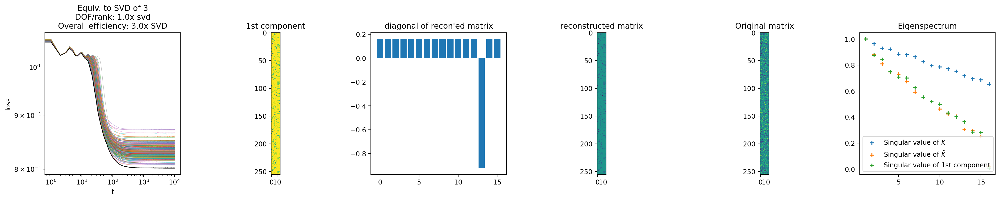

100%|██████████| 10000/10000 [00:15<00:00, 632.33it/s]


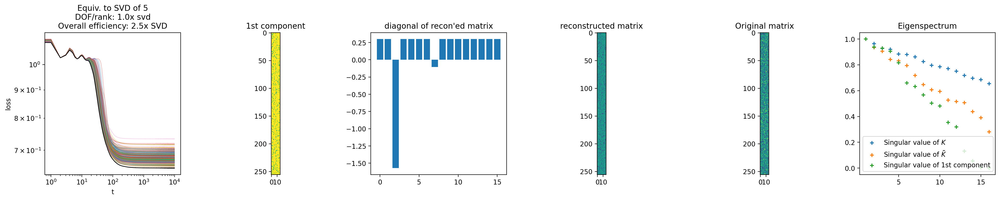

100%|██████████| 10000/10000 [00:24<00:00, 409.70it/s]


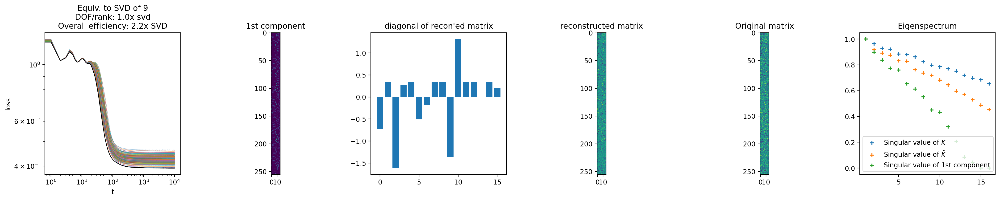

100%|██████████| 10000/10000 [00:42<00:00, 232.74it/s]


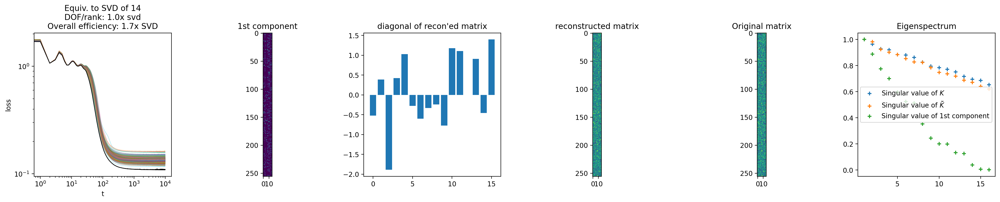

In [29]:
'''
component = sqexp(u, v)
'''

n = 256
m = 16
batch_size = 256
target = torch.normal(0.0, 1.0, (n, m))

test(
    target=target,
    ks=[1, 2, 4, 8],
    fac_callback=lambda target, k: RBFExpansionV2(
        k=k,
        rbf='gauss',
        batch_size=batch_size,
        max_steps=10000
    ).fit(
        target,
        u0=0.01 * torch.rand(batch_size, n, k),
        v0=0.01 * torch.rand(batch_size, m, k),
        a0=0.01 * torch.rand(batch_size, k),
        b0=0.01 * torch.rand(batch_size),
    )
)

100%|██████████| 10000/10000 [00:12<00:00, 788.97it/s]


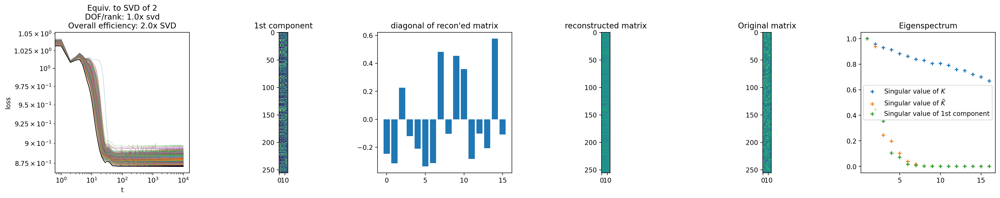

100%|██████████| 10000/10000 [00:18<00:00, 553.76it/s]


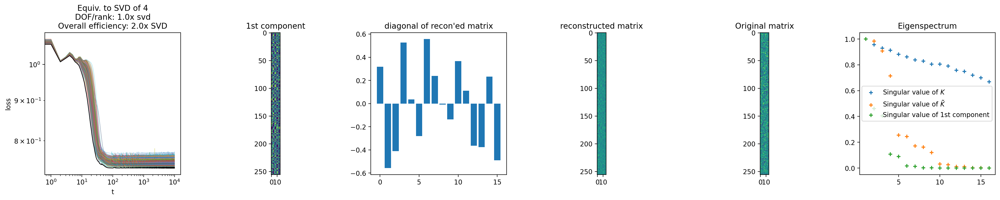

100%|██████████| 10000/10000 [00:29<00:00, 338.61it/s]


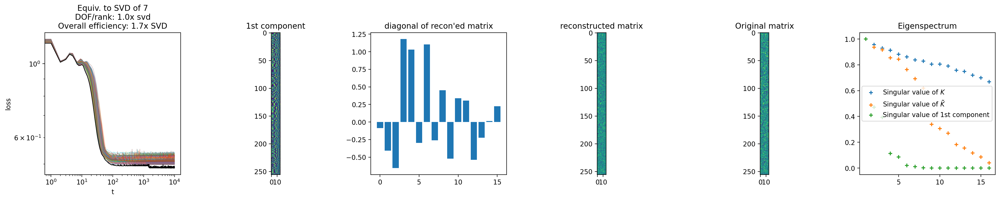

100%|██████████| 10000/10000 [00:54<00:00, 184.77it/s]


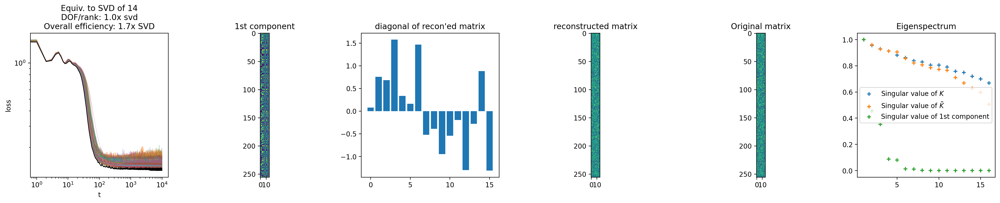

In [30]:
'''
component = periodic(u, v) with p = 1 and l = 1
'''

n = 256
m = 16
batch_size = 256
target = torch.normal(0.0, 1.0, (n, m))

test(
    target=target,
    ks=[1, 2, 4, 8],
    fac_callback=lambda target, k: RBFExpansionV2(
        k=k,
        rbf=lambda d: torch.exp(-2 * torch.square(torch.sin(np.pi * d))),
        batch_size=batch_size,
        max_steps=10000
    ).fit(
        target,
        u0=0.01 * torch.rand(batch_size, n, k),
        v0=0.01 * torch.rand(batch_size, m, k),
        a0=0.01 * torch.rand(batch_size, k),
        b0=0.01 * torch.rand(batch_size),
    )
)

100%|██████████| 10000/10000 [00:12<00:00, 777.00it/s]


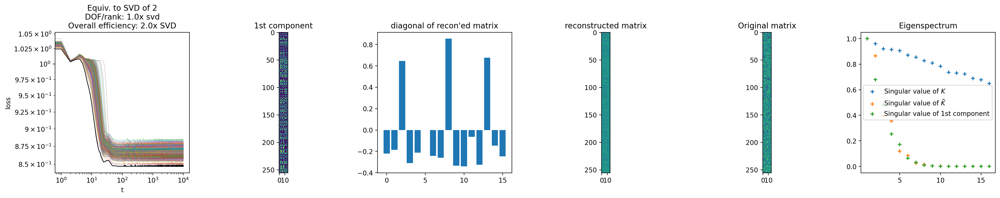

100%|██████████| 10000/10000 [00:18<00:00, 542.38it/s]


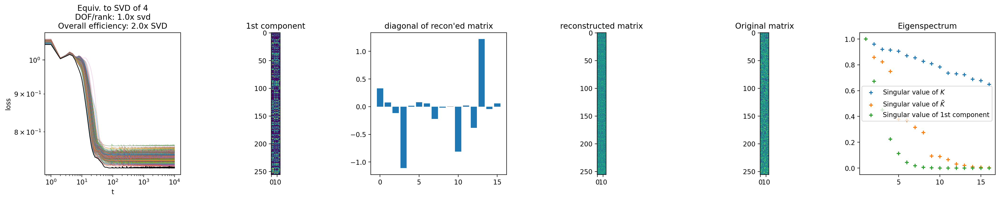

100%|██████████| 10000/10000 [00:29<00:00, 336.98it/s]


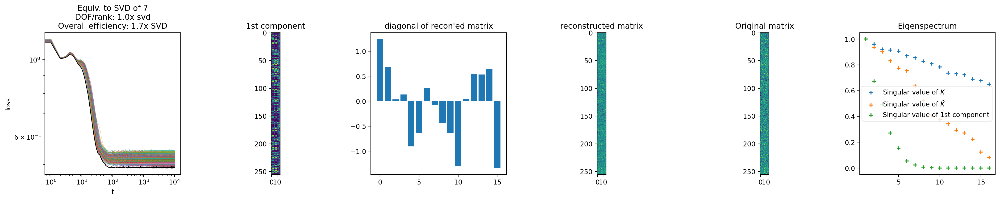

100%|██████████| 10000/10000 [00:52<00:00, 189.16it/s]


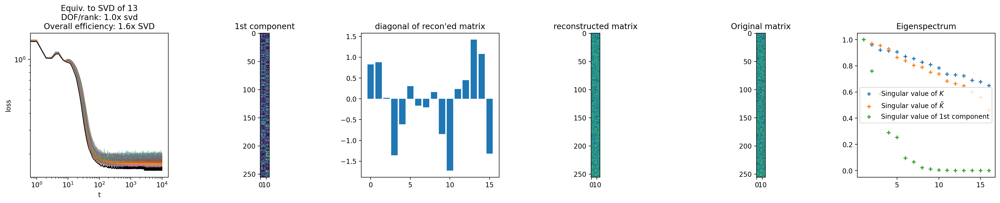

In [32]:
'''
component = periodic(u, v) with p = 1 and l = sqrt(0.5)
'''

n = 256
m = 16
batch_size = 256
target = torch.normal(0.0, 1.0, (n, m))

test(
    target=target,
    ks=[1, 2, 4, 8],
    fac_callback=lambda target, k: RBFExpansionV2(
        k=k,
        rbf=lambda d: torch.exp(-4 * torch.square(torch.sin(np.pi * d))),
        batch_size=batch_size,
        max_steps=10000
    ).fit(
        target,
        u0=0.01 * torch.rand(batch_size, n, k),
        v0=0.01 * torch.rand(batch_size, m, k),
        a0=0.01 * torch.rand(batch_size, k),
        b0=0.01 * torch.rand(batch_size),
    )
)

100%|██████████| 10000/10000 [00:13<00:00, 762.47it/s]


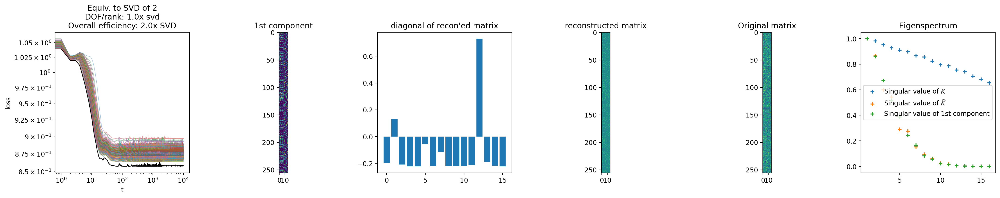

100%|██████████| 10000/10000 [00:18<00:00, 542.38it/s]


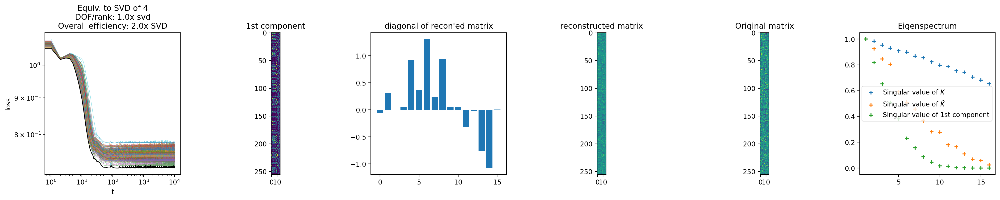

100%|██████████| 10000/10000 [00:29<00:00, 339.39it/s]


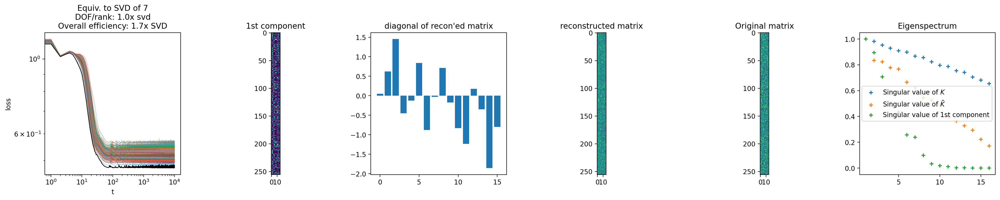

100%|██████████| 10000/10000 [00:52<00:00, 189.43it/s]


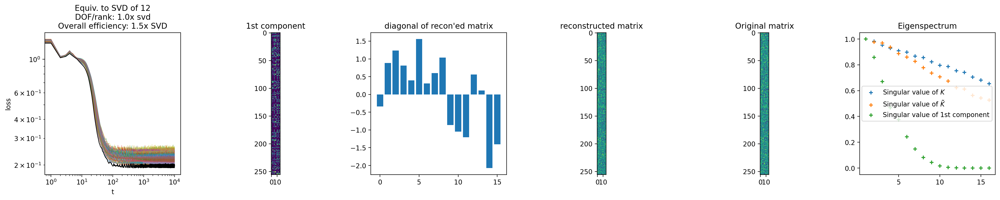

In [31]:
'''
component = periodic(u, v) with p = 1 and l = 0.5
'''

n = 256
m = 16
batch_size = 256
target = torch.normal(0.0, 1.0, (n, m))

test(
    target=target,
    ks=[1, 2, 4, 8],
    fac_callback=lambda target, k: RBFExpansionV2(
        k=k,
        rbf=lambda d: torch.exp(-8 * torch.square(torch.sin(np.pi * d))),
        batch_size=batch_size,
        max_steps=10000
    ).fit(
        target,
        u0=0.01 * torch.rand(batch_size, n, k),
        v0=0.01 * torch.rand(batch_size, m, k),
        a0=0.01 * torch.rand(batch_size, k),
        b0=0.01 * torch.rand(batch_size),
    )
)

100%|██████████| 10000/10000 [00:14<00:00, 708.83it/s]


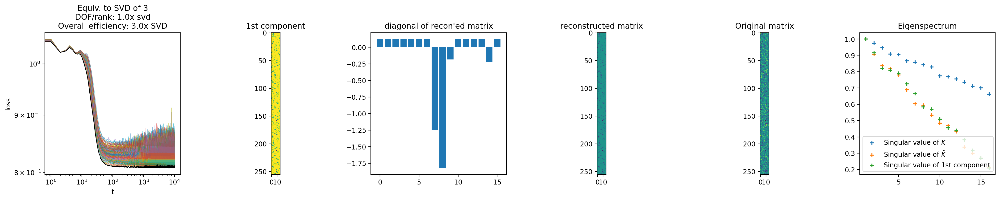

100%|██████████| 10000/10000 [00:20<00:00, 478.68it/s]


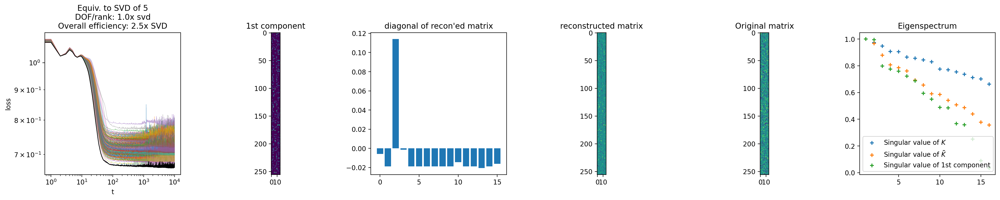

100%|██████████| 10000/10000 [00:33<00:00, 298.16it/s]


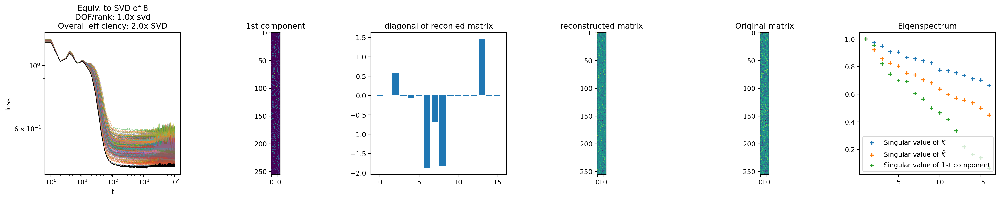

100%|██████████| 10000/10000 [00:58<00:00, 171.35it/s]


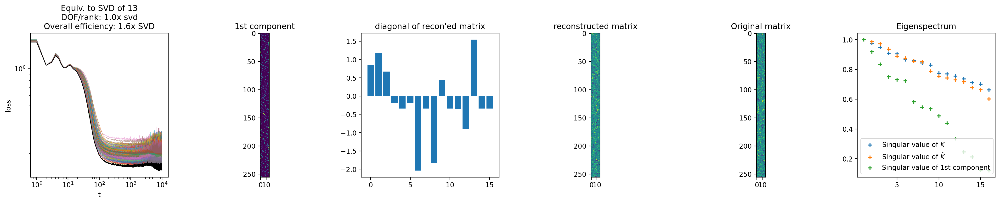

In [35]:
'''
component = modified periodic(u, v) with variable l
'''

n = 256
m = 16
batch_size = 256
target = torch.normal(0.0, 1.0, (n, m))

fac = RBFExpansionV2(k=1, rbf='gauss')

test(
    target=target,
    ks=[1, 2, 4, 8],
    fac_callback=lambda target, k: RBFExpansionV2(
        k=k,
        rbf='gauss',
        batch_size=batch_size,
        max_steps=10000
    ).fit_custom(
        target,
        f=lambda u, v, a, l, b: torch.sum(
            fac.rbf(
                torch.sin(u[..., :, None, :] - v[..., None, :, :]) * torch.exp(l[..., None, None, :])
            ) * a[..., None, None, :],
            dim=-1
        ) + b[..., None, None],
        u=0.01 * torch.rand(batch_size, n, k),
        v=0.01 * torch.rand(batch_size, m, k),
        a=0.01 * torch.rand(batch_size, k),
        l=0.01 * torch.randn(batch_size, k),
        b=0.01 * torch.rand(batch_size),
    )
)

100%|██████████| 10000/10000 [00:14<00:00, 710.72it/s]


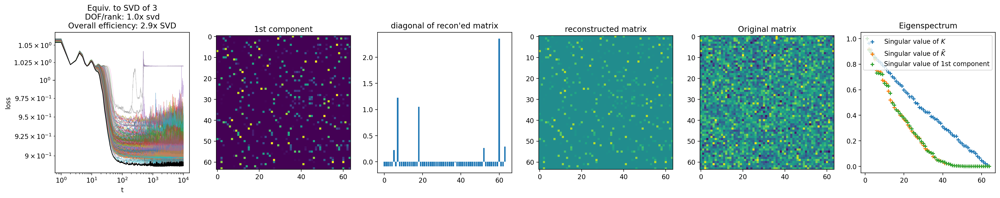

100%|██████████| 10000/10000 [00:20<00:00, 489.29it/s]


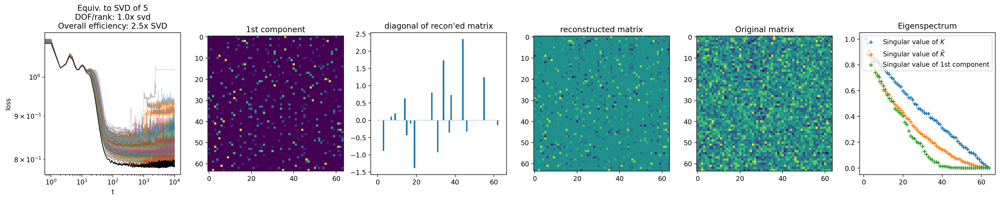

100%|██████████| 10000/10000 [00:33<00:00, 296.89it/s]


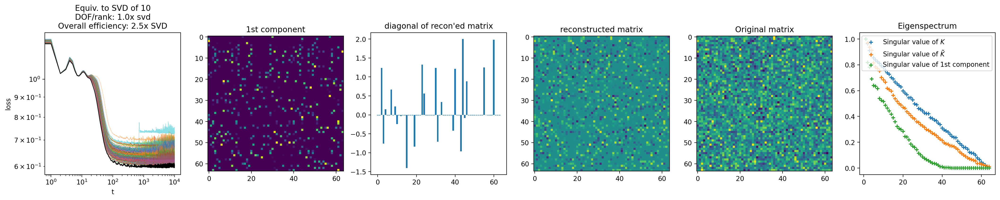

100%|██████████| 10000/10000 [00:58<00:00, 171.03it/s]


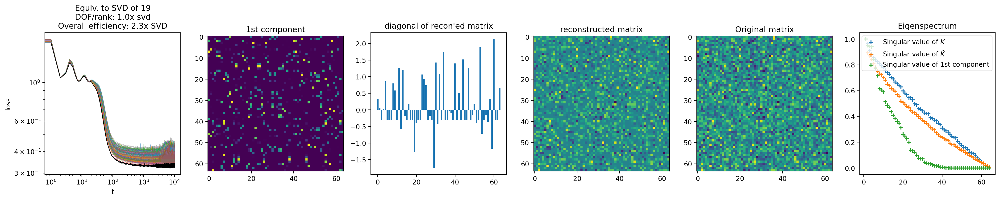

100%|██████████| 10000/10000 [01:50<00:00, 90.53it/s]


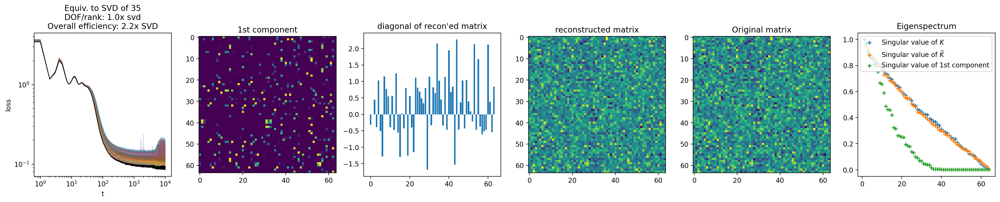

100%|██████████| 10000/10000 [04:09<00:00, 40.09it/s]


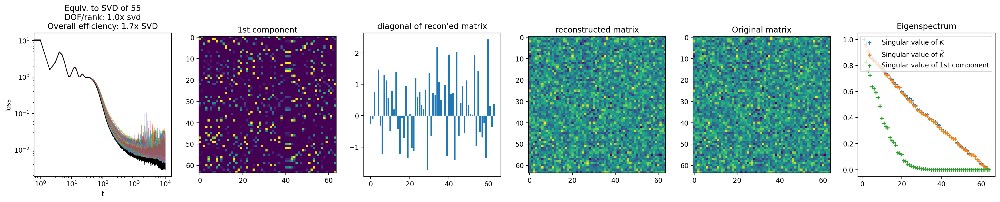

In [36]:
'''
component = modified periodic(u, v) with variable l
'''

n = 64
m = 64
batch_size = 256
target = torch.normal(0.0, 1.0, (n, m))

fac = RBFExpansionV2(k=1, rbf='gauss')

test(
    target=target,
    ks=[1, 2, 4, 8, 16, 32],
    fac_callback=lambda target, k: RBFExpansionV2(
        k=k,
        rbf='gauss',
        batch_size=batch_size,
        max_steps=10000
    ).fit_custom(
        target,
        f=lambda u, v, a, l, b: torch.sum(
            fac.rbf(
                torch.sin(u[..., :, None, :] - v[..., None, :, :]) * torch.exp(l[..., None, None, :])
            ) * a[..., None, None, :],
            dim=-1
        ) + b[..., None, None],
        u=0.01 * torch.rand(batch_size, n, k),
        v=0.01 * torch.rand(batch_size, m, k),
        a=0.01 * torch.rand(batch_size, k),
        l=0.01 * torch.randn(batch_size, k),
        b=0.01 * torch.rand(batch_size),
    )
)

# SGD

100%|██████████| 100000/100000 [05:13<00:00, 319.24it/s]


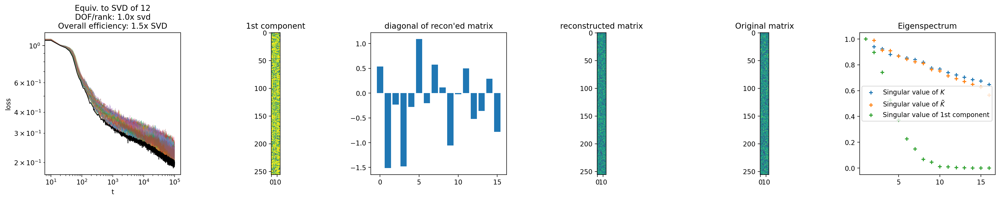

In [79]:
'''
component = modified periodic(u, v) with variable l
'''

n = 256
m = 16
batch_size = 256
target = torch.normal(0.0, 1.0, (n, m))

fac = RBFExpansionV2(k=1, rbf='gauss')

test(
    target=target,
    ks=[8],
    fac_callback=lambda target, k: RBFExpansionMiniBatch(
        k=k,
        mini_batch_size=4 * n,
        rbf='gauss',
        batch_size=batch_size,
        lr=0.1,
        max_steps=100000,
        mini_batch_by='elements'
    ).fit_custom(
        target,
        f=lambda u, v, a, l, b: torch.sum(
            fac.rbf(
                torch.sin(u[..., :, None, :] - v[..., None, :, :]) * torch.exp(l[..., None, None, :])
            ) * a[..., None, None, :],
            dim=-1
        ) + b[..., None, None],
        f_minibatch=lambda i, j, u, v, a, l, b: torch.sum(
            fac.rbf(
                torch.sin(u[..., i, :] - v[..., j, :]) * torch.exp(l[..., None, :])
            ) * a[..., None, :],
            dim=-1
        ) + b[..., None],
        u=0.01 * torch.rand(batch_size, n, k),
        v=0.01 * torch.rand(batch_size, m, k),
        a=0.01 * torch.rand(batch_size, k),
        l=0.01 * torch.randn(batch_size, k),
        b=0.01 * torch.rand(batch_size),
    )
)

---
END